In [1]:
import json
import numpy as np
import pandas as pd

from IPython.display import Image
import cv2

import glob   # get a list of files in a directory
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

import holoviews as hv
hv.extension('bokeh')

ImportError: None of the backends could be imported

In [2]:
jdata = json.load(open("../data/train.json"))
    

In [3]:
jdata

{'annotations': [{'image_id': 1, 'label_id': 5},
  {'image_id': 2, 'label_id': 5},
  {'image_id': 3, 'label_id': 5},
  {'image_id': 4, 'label_id': 5},
  {'image_id': 5, 'label_id': 5},
  {'image_id': 6, 'label_id': 5},
  {'image_id': 7, 'label_id': 5},
  {'image_id': 8, 'label_id': 5},
  {'image_id': 9, 'label_id': 5},
  {'image_id': 10, 'label_id': 5},
  {'image_id': 11, 'label_id': 5},
  {'image_id': 12, 'label_id': 5},
  {'image_id': 13, 'label_id': 5},
  {'image_id': 14, 'label_id': 5},
  {'image_id': 15, 'label_id': 5},
  {'image_id': 16, 'label_id': 5},
  {'image_id': 17, 'label_id': 5},
  {'image_id': 18, 'label_id': 5},
  {'image_id': 19, 'label_id': 5},
  {'image_id': 20, 'label_id': 5},
  {'image_id': 21, 'label_id': 5},
  {'image_id': 22, 'label_id': 5},
  {'image_id': 23, 'label_id': 5},
  {'image_id': 24, 'label_id': 5},
  {'image_id': 25, 'label_id': 5},
  {'image_id': 26, 'label_id': 5},
  {'image_id': 27, 'label_id': 5},
  {'image_id': 28, 'label_id': 5},
  {'image_id':

### Figure out the labels and compile them into a list of labels to see how many unique ones there are. Could do this with pandas too.

In [4]:
image_annotations = jdata["annotations"]

image_labels = np.array([item['label_id'] for item in image_annotations])

label_set = set(image_labels)
print(label_set)

{1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128}


### Has 128 total labels, determine file counts for each label type

In [5]:
label_counts = np.zeros(128, dtype=int)

for label in label_set:
    # subtract 1 from index because labels are not zero based
    label_counts[label-1] = np.sum(image_labels == label)
    
print(label_counts[:20])

[1254 1521 2368 1500 1599 1115 1609 1365  477 1992 1748 2609 1640 1877 1071
 1366 1491 1570  855 3996]


In [6]:
# # figure out the occurrence rate of labels for each label

# label_counts = np.zeros(128, dtype=int)

# print(label_counts[0:5])

# for idx, item in enumerate(image_labels):
    
# #     if idx > 5:
# #         break
        
# #     print(idx, item)
# #     print(label_counts[item-1])
#     label_counts[item-1] += 1
    
# label_counts

### Figure out the counts of the files that we were actually able to download

In [7]:
# path is relative to where your images are stored and where your notebook is running
# my structure:
# root
# ├── .gitignore
# ├── notebooks
# ├── src
# ├── imgs
# └── data
#     └── imgs
#            └── 3423_84.jpg (etc) 
#            └── 3424_84.jpg (etc) 
#            └── 3425_84.jpg (etc) 
file_paths = glob.glob("../data/imgs/*.jpg")   

# convert the path + files to the filename part of the file, while dropping file extension (.jpg)
# make a list of the file names, should be things like "324_85" the 85 part is the label.
files = [file.split("/")[-1].split(".")[0] for file in file_paths]

actual_counts = np.zeros(128, dtype=int)

for _file in files:
    # convert filename like '5766_86' to simply the label type, as an integer: 86
    temp_index = int(_file.split("_")[-1])
    
    actual_counts[temp_index-1] += 1
    
print(actual_counts[:20])

[1236 1480 2344 1440 1580 1087 1580 1339  467 1959 1703 2571 1571 1847 1039
 1331 1456 1527  839 3949]


### Figure out the difference between how many files there should be (labels) and how many there actually are

In [8]:
missing_counts = label_counts - actual_counts

### Create a dataframe so the information is zipped when it gets sorted

In [9]:
# convert label_set to a list so pandas can understand it
data = pd.DataFrame({"label": list(label_set), "count":label_counts, "actual_count":actual_counts, "missing_count":missing_counts})

# make sure labels are first, for readability
data = data[["label", "count", "actual_count", "missing_count"]]

# sort so that it displays nicely as a decreasing curve
data = data.sort_values("count", ascending=True)

data.head()    # looks reasonable

,label,count,actual_count,missing_count
82,83,332,320,12
65,66,342,338,4
123,124,415,410,5
120,121,442,430,12
8,9,477,467,10


### Do some processing because going to use holoviews for interactive chart and better display than matplotlib

In [10]:
# reset the index so the for loop below works properly
# create a copy of the processed data so we don't accidentally
# stomp on it trying to get stuff to work
temp_data = data.reset_index(drop=True)

# process into a format that holoviews can comprehend
# Tuple with 3 items, label, type of value, value:
#
# ('83', 'Existing Files', 320)
# ('83', 'Missing Files', 12)
# ('66', 'Existing Files', 338)
# ('66', 'Missing Files', 4)
# ('124', 'Existing Files', 410)

chart_data_list = []
for idx in range(len(temp_data)):    
    temp = temp_data.loc[idx, :].values
#     print(temp)
#     [ 83 332 320  12]
#     [ 66 342 338   4]
#     [124 415 410   5]
#     [121 442 430  12]
    
    # add label with existing file count
    chart_data_list.append((str(temp[0]), "Existing Files", temp[2]))
    
    # add label with missing file count
    chart_data_list.append((str(temp[0]), "Missing Files", temp[-1] ))
    
# convert new list of tuples to a dataframe again so we can feed it to holoviews
cdl = pd.DataFrame(chart_data_list, columns=["label", "missing", "count"])

cdl.head()   # seems like holoviews can use this

,label,missing,count
0,83,Existing Files,320
1,83,Missing Files,12
2,66,Existing Files,338
3,66,Missing Files,4
4,124,Existing Files,410


In [11]:
# convert to a holoviews table object
# http://holoviews.org/gallery/demos/bokeh/bars_economic.html

# 'Label' will be the tick marks
# 'File' will be the values for either missing or existing files
_keys = [('label', 'Label'), ('missing', "File Type")]

# the axis is simply 'Count' of files (because the graph is rotated to present more clearly the axis is X)
# as will become clear just below
_vals = [('count', "File Count")]
macro = hv.Table(cdl, _keys, _vals)
macro

:Table   [label,missing]   (count)

### Where the magic actually happens

In [13]:
%%opts Bars [stack_index=1 width=800 height=1600 invert_axes=True show_legend=False tools=['hover'] show_title=True title_format="Label Counts, Downloaded Files and Missing Files"]
macro.to.bars(["Label", "File Type"], "File Count", [] )

:Bars   [label,missing]   (count)

#### Static plot since the above runs on local server/jupyter

![title](label_distribution.png)

In [85]:
def display_images(label, number=25):
    '''
    Displays images for some light eda, randomly displays pictures of matching labels
    Has numpy and matplotlib as dependencies
    
    Inputs:
    label:   which label to match and pull files from
    number:  how many images to display, approximately (alg will round to multiple for ease of display)
    
    Output:
    Displays images in jupyter frame
    '''
    # all file paths, as a list
    file_paths = glob.glob("../data/imgs/*.jpg") 
    
    # get a list of matching file paths
    matching_paths = [path for path in file_paths if "_{:}.jpg".format(label) in path]
    
    rows = int(number/5)
    total_pics = rows * 5
    
    fig, axs = plt.subplots(rows, 5, figsize=(15, 15))
    
    for idx, img in enumerate(matching_paths[:total_pics]):
        image = mpimg.imread(img)
        axs.flatten()[idx].imshow(image)
        axs.flatten()[idx].axis("off")
    
#     plt.tight_layout(pad=-1.5, w_pad=-1.5, h_pad=-1.5)
    plt.tight_layout(pad=-3.75)

### 3 Smallest Classes are 83, 66, 124

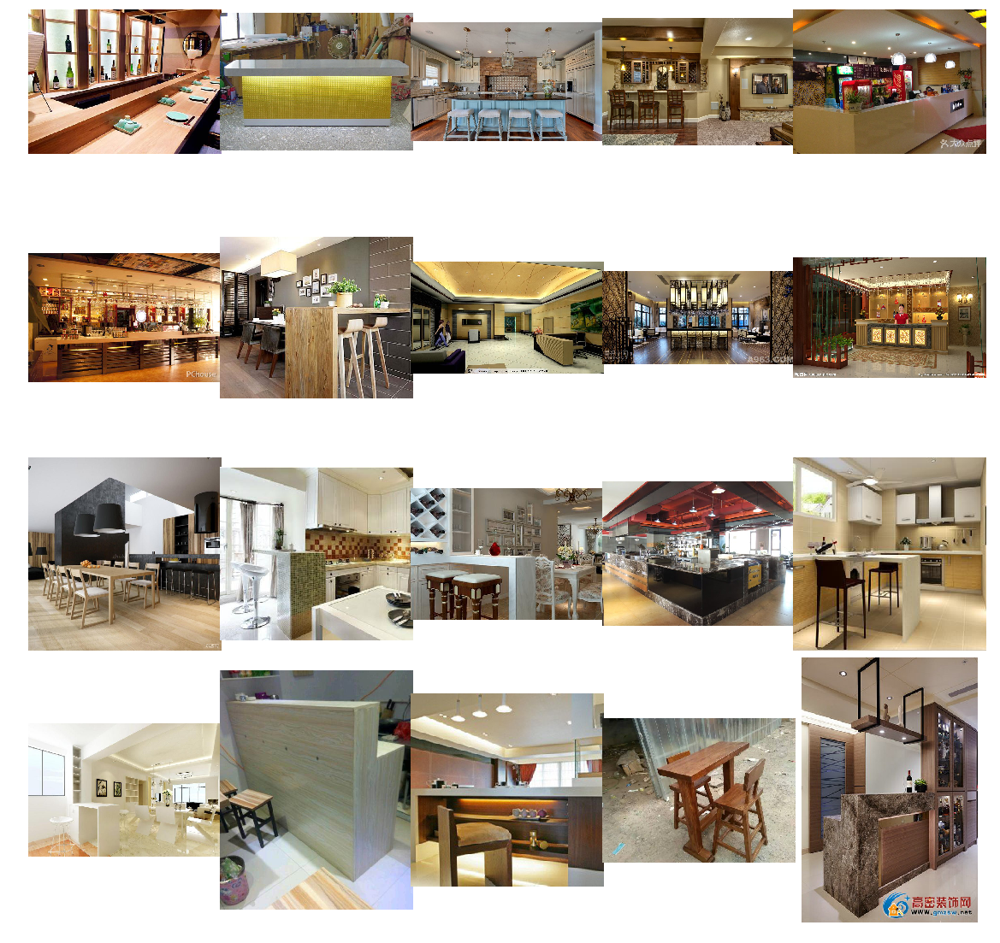

In [89]:
# charitably classed as "eating area"?

display_images(label=83, number=21)

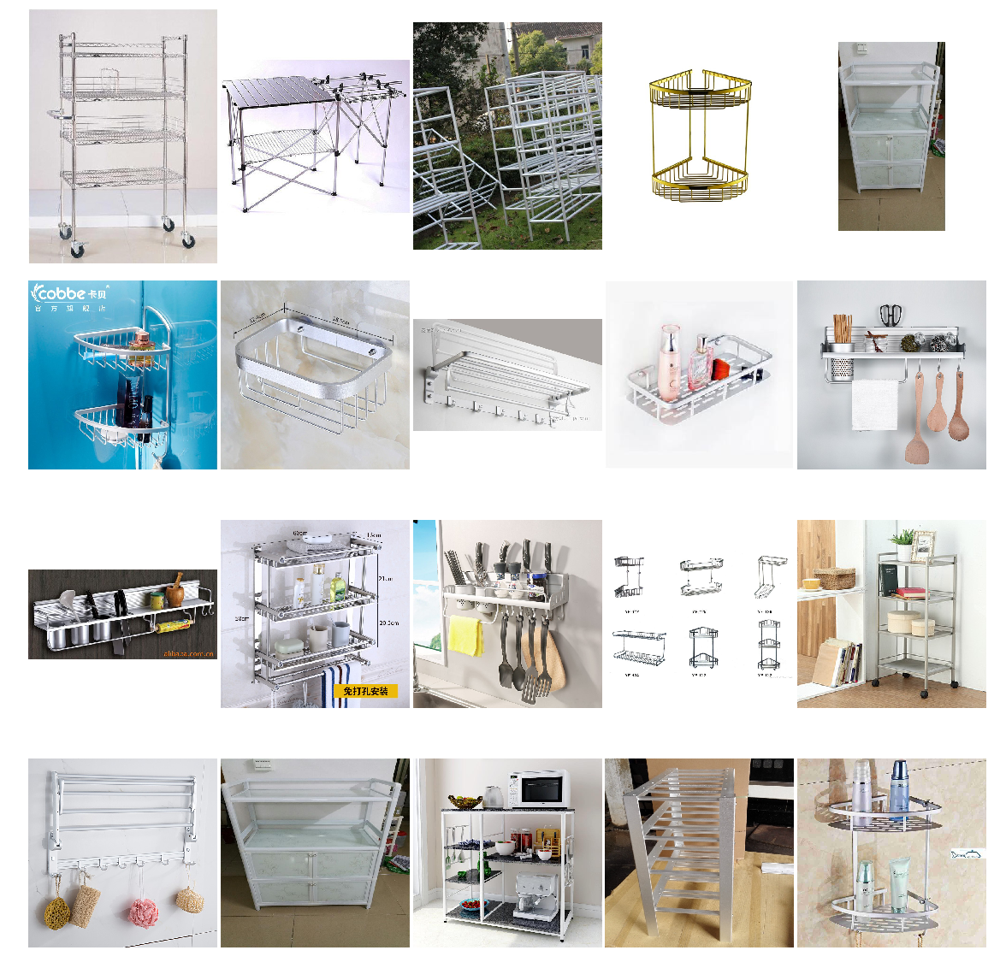

In [91]:
# charitably classed as "wireframe holder"?

display_images(label=66, number=21)

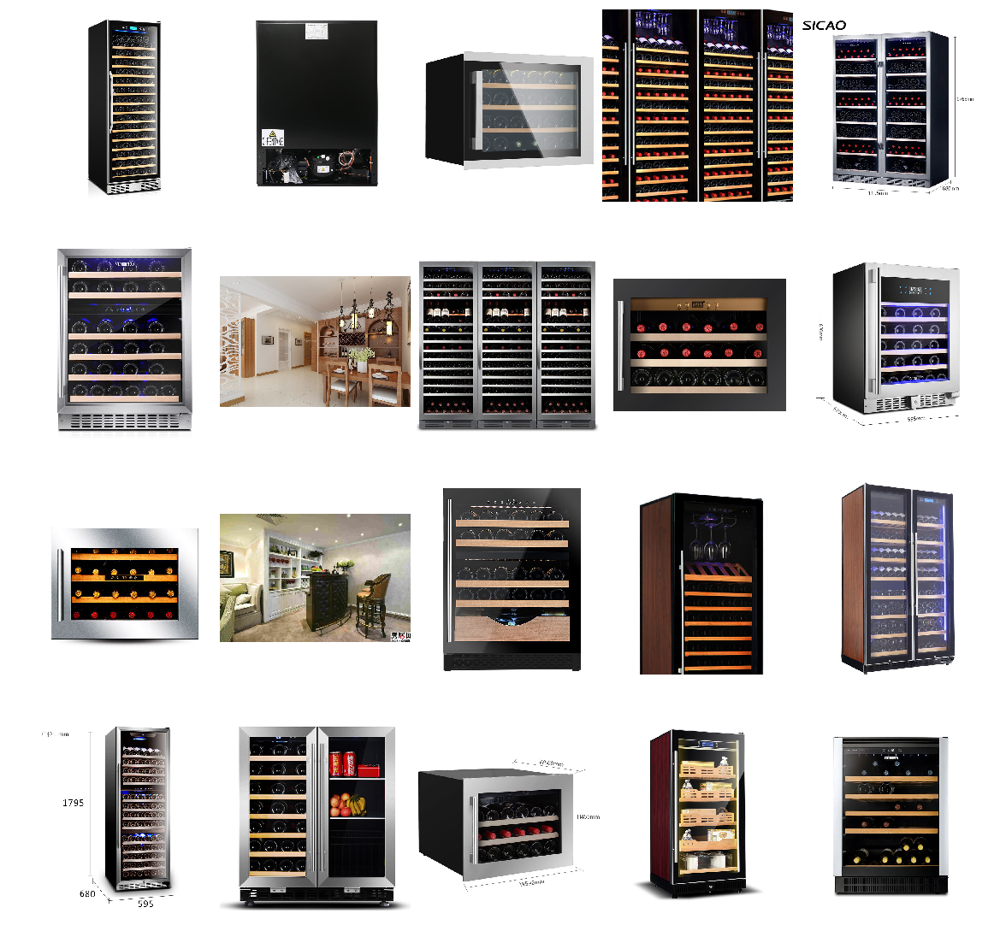

In [92]:
# charitably classed as "wine rack / wine fridge"?

display_images(label=124, number=21)

### 3 Largest Classes are 20, 42, 92

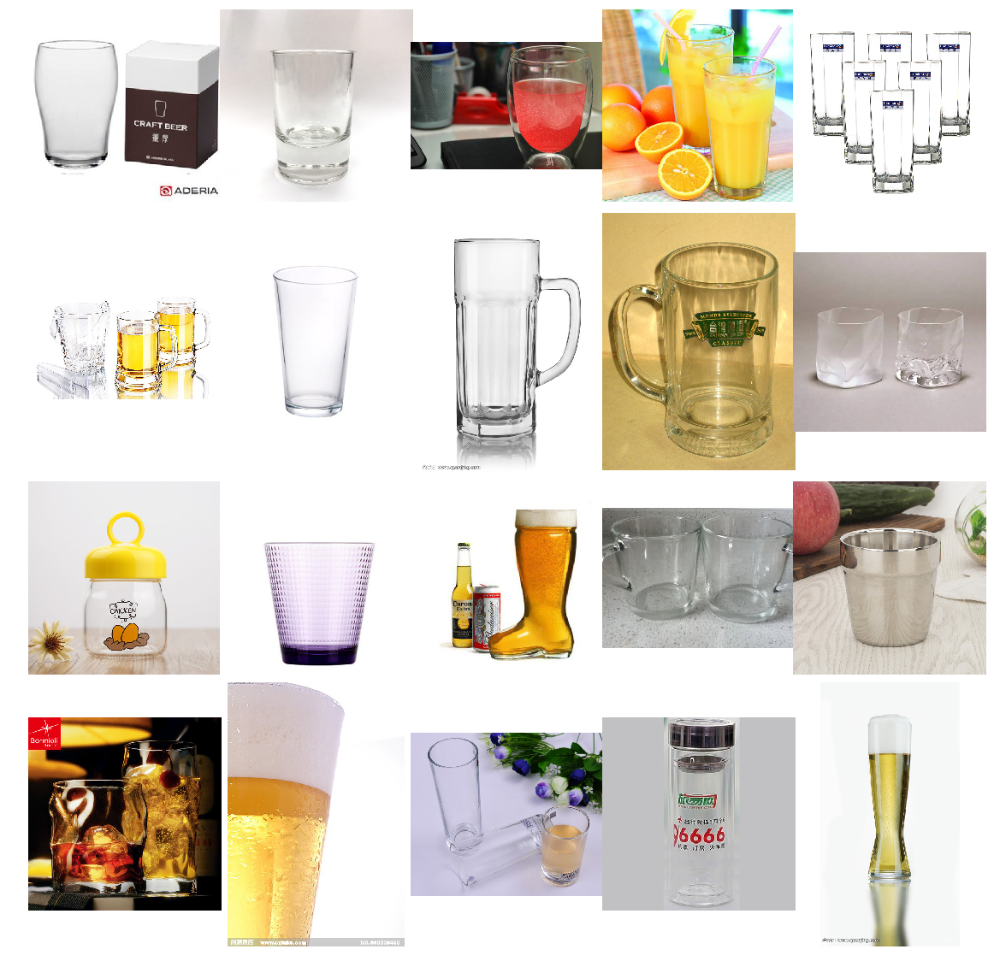

In [102]:
# 1: classed as "glass (drinking)"

display_images(label=20, number=21)

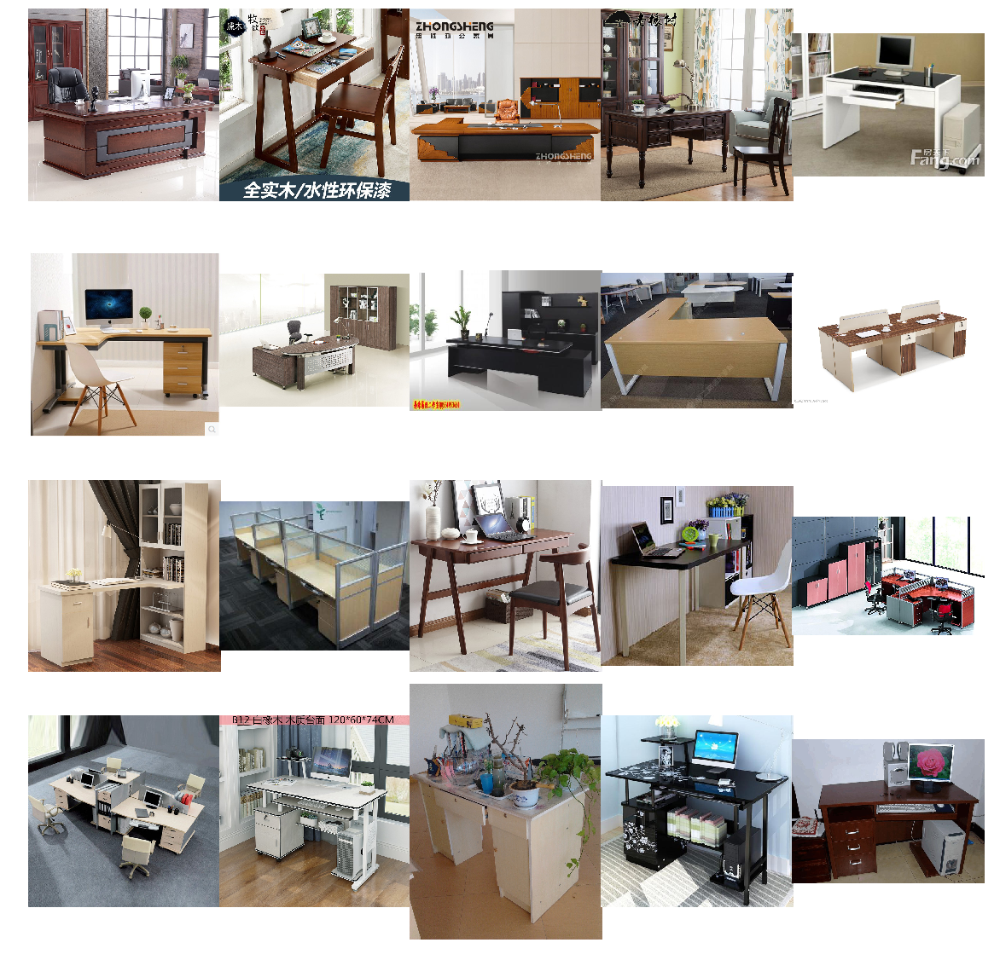

In [101]:
# 2: classed as "desk"

display_images(label=42, number=21)

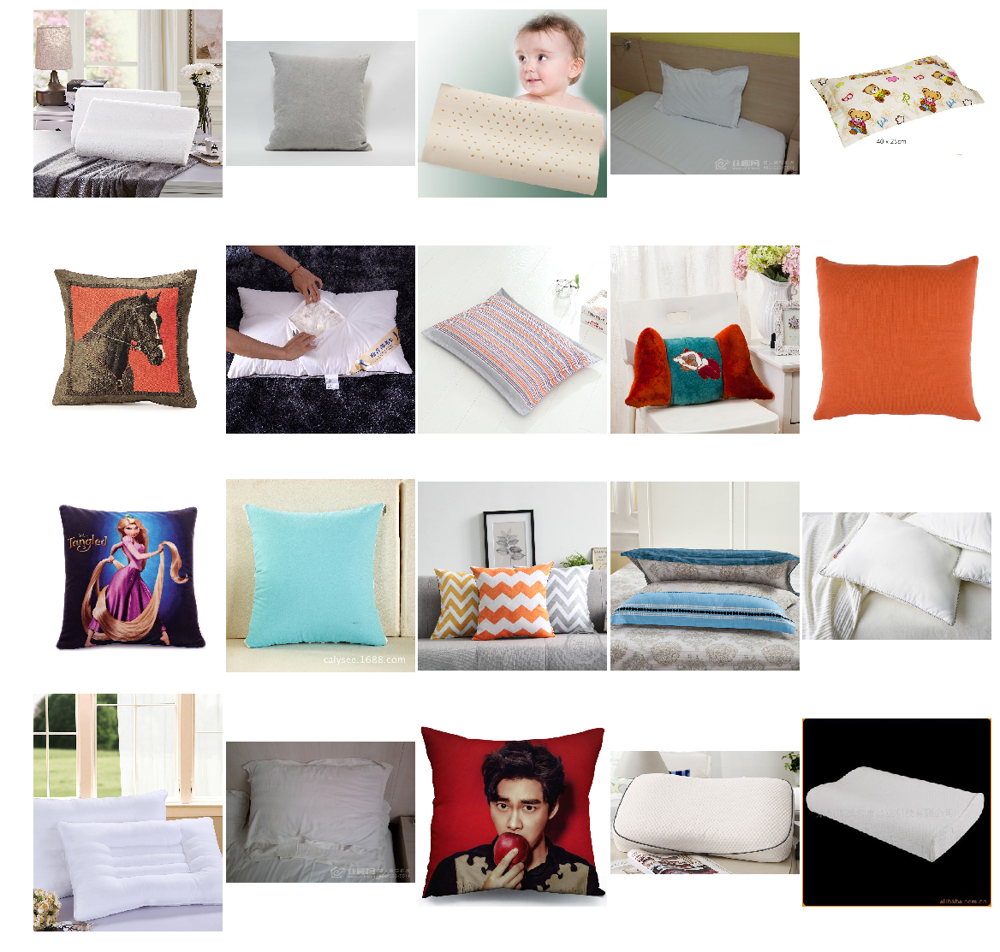

In [100]:
# 3: classed as "pillow"

display_images(label=92, number=20)

In [11]:
# image = mpimg.imread(img)

t = cv2.imread('../data/stage1_imgs/flip_116297_85.jpg')

t[0, 0:3]

array([[252, 254, 254],
       [251, 253, 253],
       [251, 253, 253]], dtype=uint8)

In [18]:
mu, std = np.mean(t), np.std(t)
test = (t - mu) / std

# min -2.5940256192832045
# max 1.4030695654345213

test = (test - test.min()) / (test.max() - test.min()) - 0.5

print("min", test.min())
print("max", test.max())
print("mean", np.mean(test))
test[0, 0:3]

min -0.5
max 0.5
mean 0.14897769490230295


array([[0.48823529, 0.49607843, 0.49607843],
       [0.48431373, 0.49215686, 0.49215686],
       [0.48431373, 0.49215686, 0.49215686]])